# Assignment – 8: Clustering Seismic Data Analysis
**Dataset:** ISC-GEM Global Earthquake Catalogue (`isc-gem-cat.csv`)

**Objective:** Apply unsupervised clustering techniques — K-Means, DBSCAN, Hierarchical Clustering, and Gaussian Mixture Model (GMM) — to discover natural groupings in global earthquake data.

**Methods covered:**
1. Data Loading & Preprocessing
2. Exploratory Data Analysis (EDA)
3. K-Means Clustering (Elbow Method + World Map)
4. DBSCAN Clustering (k-distance plot + World Map)
5. Hierarchical Clustering (Silhouette Score + World Map)
6. Gaussian Mixture Model (AIC/BIC + World Map)
7. Comparison & Conclusions

## 1. Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Scikit-learn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Scipy for dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Plotly for interactive world maps
import plotly.express as px
import plotly.graph_objects as go

print('All libraries imported successfully!')

All libraries imported successfully!


## 2. Load and Inspect the Dataset

In [ ]:
import pandas as pd

# 1. PEAK AT THE FILE (Optional but recommended)
# This helps you verify exactly where the header is if 'skiprows=92' isn't perfect for your version.
with open('isc-gem-cat.csv', 'r') as f:
    for i in range(5): # Adjust range to see more lines if needed
        print(f"Line {i}: {f.readline().strip()}")

# 2. LOAD THE DATA
# Most ISC-GEM files have ~92 lines of metadata.
# We use 'skiprows' to jump straight to the column headers.
df = pd.read_csv(
    'isc-gem-cat.csv',
    skiprows=92,
    low_memory=False,
    on_bad_lines='warn' # This will alert you if a specific row is still messy
)

# 3. VERIFY
print('\n--- Catalogue Loaded ---')
print('Shape:', df.shape)
print('\nColumn names:', df.columns.tolist())
df.head()

Line 0: # ISC-GEM Global Instrumental Earthquake Catalogue
Line 1: # Version 12.1 - released on 2025-11-26
Line 2: #
Line 3: # Copyright (C) 2025 International Seismological Centre (ISC)
Line 4: #

--- Catalogue Loaded ---
Shape: (21, 2)

Column names: ['#                                                                  Added 543 earthquakes in 2017', ' which also include continental earthquakes with magnitude 5-5.5.']


,# Added 543 earthquakes in 2017,which also include continental earthquakes with magnitude 5-5.5.
0,# ...,NaN
1,# ...,NaN
2,# ...,NaN
3,# Version 9.0 Released on 2022-03-15 (period...,NaN
4,# ...,which also include shallow earthquakes with ...


In [ ]:
# Basic info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column                                                                                            Non-Null Count  Dtype 
---  ------                                                                                            --------------  ----- 
 0   #                                                                  Added 543 earthquakes in 2017  21 non-null     object
 1    which also include continental earthquakes with magnitude 5-5.5.                                 6 non-null      object
dtypes: object(2)
memory usage: 468.0+ bytes


In [ ]:
# Descriptive statistics
df.describe()

,# Added 543 earthquakes in 2017,which also include continental earthquakes with magnitude 5-5.5.
count,21,6
unique,19,4
top,#,which also include earthquakes with Mw 5.0-5....
freq,3,3


In [ ]:
# Check missing values
missing = df.isnull().sum()
print('Missing values per column:')
print(missing[missing > 0])

Missing values per column:
which also include continental earthquakes with magnitude 5-5.5.    15
dtype: int64


## 3. Data Preprocessing

In [ ]:
import pandas as pd

# 1. FIND THE HEADER INDEX
header_idx = 0
with open('isc-gem-cat.csv', 'r') as f:
    for i, line in enumerate(f):
        # We look for the line that defines the columns
        if 'lat' in line.lower() and 'date' in line.lower():
            header_idx = i
            break

# 2. LOAD THE FILE
# We use sep=',' and on_bad_lines to ignore the "junk" rows
df = pd.read_csv(
    'isc-gem-cat.csv',
    skiprows=header_idx,
    on_bad_lines='skip',
    engine='c', # Fast engine
    low_memory=False
)

# 3. CLEAN COLUMNS (Fixed the .str.lower() error)
df.columns = df.columns.str.replace('#', '').str.strip().str.lower()

# 4. SELECT COLUMNS DYNAMICALLY
# This handles version differences (some use 'dep', some use 'depth')
cols_in_file = df.columns.tolist()

# Find the best matches for our required features
lat_col = next((c for c in cols_in_file if c in ['lat', 'latitude']), None)
lon_col = next((c for c in cols_in_file if c in ['lon', 'longitude']), None)
dep_col = next((c for c in cols_in_file if c in ['depth', 'dep']), None)
smaj_col = next((c for c in cols_in_file if c in ['smajax', 's_lat']), None)
smin_col = next((c for c in cols_in_file if c in ['sminax', 's_lon']), None)

features = [c for c in [lat_col, lon_col, dep_col, smaj_col, smin_col] if c is not None]

# 5. FINAL CLEANING
# Convert only the columns we found to numeric
df_cleaned = df[features].apply(pd.to_numeric, errors='coerce').dropna().reset_index(drop=True)

print(f"✅ Success! Found header at line {header_idx}")
print(f"Columns found: {features}")
print(f"Total valid earthquake rows: {len(df_cleaned)}")
display(df_cleaned.head())

✅ Success! Found header at line 116
Columns found: ['lat', 'lon', 'depth', 'smajax', 'sminax']
Total valid earthquake rows: 74156


,lat,lon,depth,smajax,sminax
0,41.802,23.108,15.0,8.6,6.6
1,41.758,23.249,15.0,8.3,6.9
2,51.424,161.638,15.0,33.6,18.7
3,52.763,160.277,30.0,28.6,14.6
4,30.684,100.608,15.0,16.9,14.4


In [ ]:
# Feature Scaling — StandardScaler: zero mean, unit variance
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_cleaned[features])

print('Scaled data shape:', scaled_data.shape)
print('Mean per feature (should be ~0):', scaled_data.mean(axis=0).round(4))
print('Std per feature  (should be ~1):', scaled_data.std(axis=0).round(4))

Scaled data shape: (74156, 5)
Mean per feature (should be ~0): [ 0.  0.  0. -0.  0.]
Std per feature  (should be ~1): [1. 1. 1. 1. 1.]


## 4. Exploratory Data Analysis (EDA)

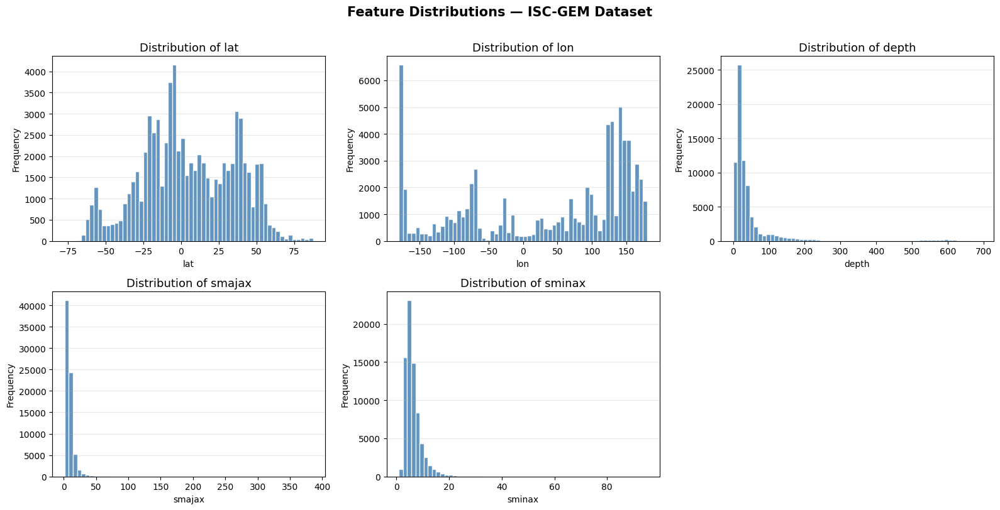

In [ ]:
# Distribution of each feature
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
axes = axes.flatten()

for i, col in enumerate(features):
    axes[i].hist(df_cleaned[col], bins=60, color='steelblue', edgecolor='white', alpha=0.85)
    axes[i].set_title(f'Distribution of {col}', fontsize=13)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].grid(axis='y', alpha=0.3)

axes[-1].axis('off')  # hide empty subplot
plt.suptitle('Feature Distributions — ISC-GEM Dataset', fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_distributions.png', dpi=150, bbox_inches='tight')
plt.show()

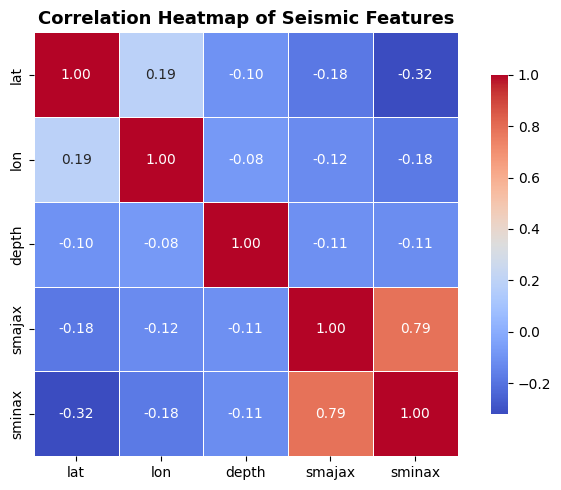

In [ ]:
# Correlation heatmap
plt.figure(figsize=(7, 5))
corr = df_cleaned[features].corr()
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm',
            square=True, linewidths=0.5, cbar_kws={'shrink': 0.8})
plt.title('Correlation Heatmap of Seismic Features', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('eda_correlation.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Raw geographic scatter — all earthquake locations
fig = px.scatter_geo(
    df_cleaned, lat='lat', lon='lon',
    color='depth',
    color_continuous_scale='Viridis',
    projection='natural earth',
    title='Global Earthquake Locations (Coloured by Depth)',
    opacity=0.5,
    width=900, height=500
)
fig.update_traces(marker=dict(size=3))
fig.show()

## 5. K-Means Clustering

### 5.1 Elbow Method to Find Optimal k

In [ ]:
k_range = range(1, 31)
inertia = []

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    km.fit(scaled_data)
    inertia.append(km.inertia_)
    print(f'k={k:2d}  inertia={km.inertia_:.1f}')

k= 1  inertia=370780.0
k= 2  inertia=282447.4
k= 3  inertia=223747.3
k= 4  inertia=175964.8
k= 5  inertia=146024.4
k= 6  inertia=126306.7
k= 7  inertia=108460.9
k= 8  inertia=98987.9
k= 9  inertia=91208.7
k=10  inertia=85648.6
k=11  inertia=80607.9
k=12  inertia=76154.4
k=13  inertia=71906.8
k=14  inertia=67985.1
k=15  inertia=65206.3
k=16  inertia=62713.1
k=17  inertia=60294.8
k=18  inertia=57054.3
k=19  inertia=55378.0
k=20  inertia=53255.8
k=21  inertia=51541.8
k=22  inertia=49571.0
k=23  inertia=48192.1
k=24  inertia=46852.4
k=25  inertia=45484.1
k=26  inertia=44363.1
k=27  inertia=42854.3
k=28  inertia=41764.1
k=29  inertia=40912.5
k=30  inertia=39886.1


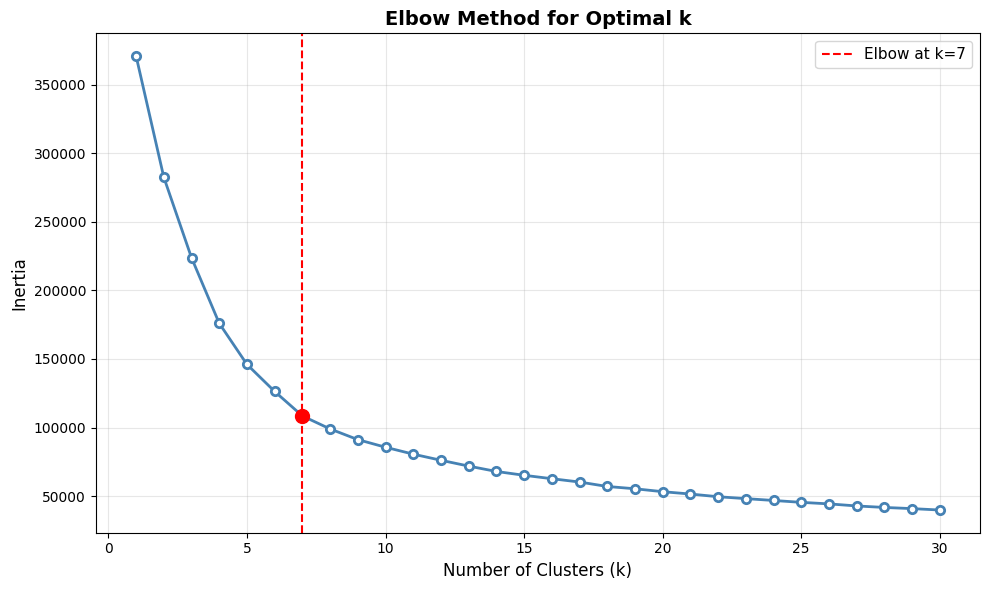

Selected optimal k = 7


In [ ]:
# Plot Elbow Curve
plt.figure(figsize=(10, 6))
plt.plot(list(k_range), inertia, marker='o', color='steelblue',
         linewidth=2, markersize=6, markerfacecolor='white', markeredgewidth=2)

# Highlight the elbow point (k=7)
optimal_k = 7
plt.axvline(x=optimal_k, color='red', linestyle='--', linewidth=1.5,
            label=f'Elbow at k={optimal_k}')
plt.scatter([optimal_k], [inertia[optimal_k - 1]], color='red', s=100, zorder=5)

plt.title('Elbow Method for Optimal k', fontsize=14, fontweight='bold')
plt.xlabel('Number of Clusters (k)', fontsize=12)
plt.ylabel('Inertia', fontsize=12)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('kmeans_elbow.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Selected optimal k = {optimal_k}')

**Observation:** The inertia drops sharply until k ≈ 7 and then levels off, forming the 'elbow'. Hence k=7 is chosen as the optimal number of clusters.

### 5.2 Fit K-Means with k=7

In [ ]:
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_cleaned['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

print('K-Means cluster distribution:')
print(df_cleaned['kmeans_cluster'].value_counts().sort_index())

K-Means cluster distribution:
kmeans_cluster
0    19528
1    13976
2    22206
3     2824
4     5782
5     9324
6      516
Name: count, dtype: int64


In [ ]:
# Silhouette score for K-Means
# (Computed on a sample if dataset is large, for speed)
sample_size = min(10000, len(scaled_data))
idx = np.random.choice(len(scaled_data), sample_size, replace=False)
km_sil = silhouette_score(scaled_data[idx], df_cleaned['kmeans_cluster'].values[idx])
print(f'K-Means Silhouette Score (k={optimal_k}): {km_sil:.4f}')

K-Means Silhouette Score (k=7): 0.3432


### 5.3 K-Means World Map

In [ ]:
fig = px.scatter_geo(
    df_cleaned, lat='lat', lon='lon',
    color='kmeans_cluster',
    color_continuous_scale='Plasma',
    projection='natural earth',
    title='KMeans Clustering on World Map',
    opacity=0.6,
    width=950, height=520
)
fig.update_traces(marker=dict(size=3))
fig.show()

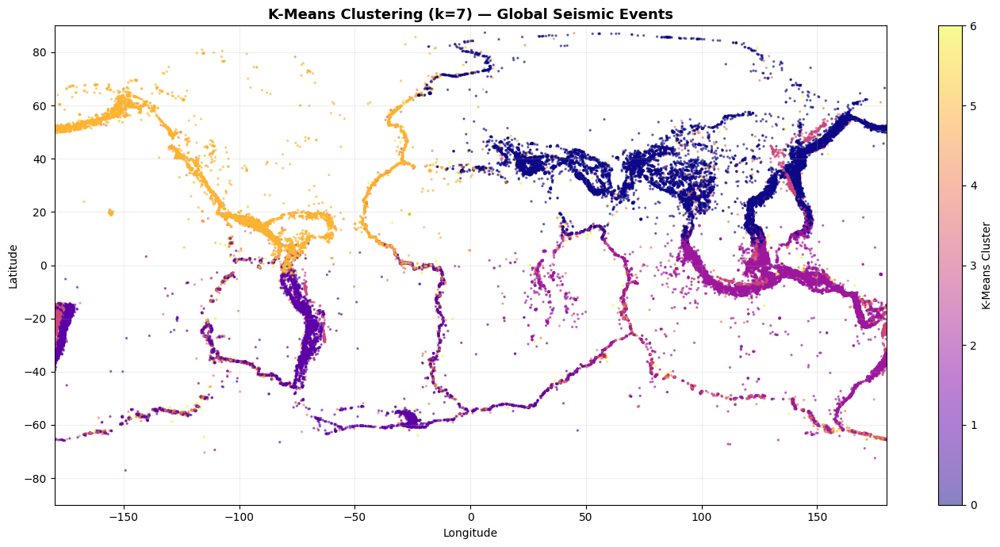

In [ ]:
# Static matplotlib version for report
fig, ax = plt.subplots(figsize=(14, 7))
scatter = ax.scatter(df_cleaned['lon'], df_cleaned['lat'],
                     c=df_cleaned['kmeans_cluster'], cmap='plasma',
                     s=2, alpha=0.5)
plt.colorbar(scatter, ax=ax, label='K-Means Cluster')
ax.set_title('K-Means Clustering (k=7) — Global Seismic Events', fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('kmeans_world_map.png', dpi=150, bbox_inches='tight')
plt.show()

## 6. DBSCAN Clustering

### 6.1 k-Distance Plot to Select Epsilon

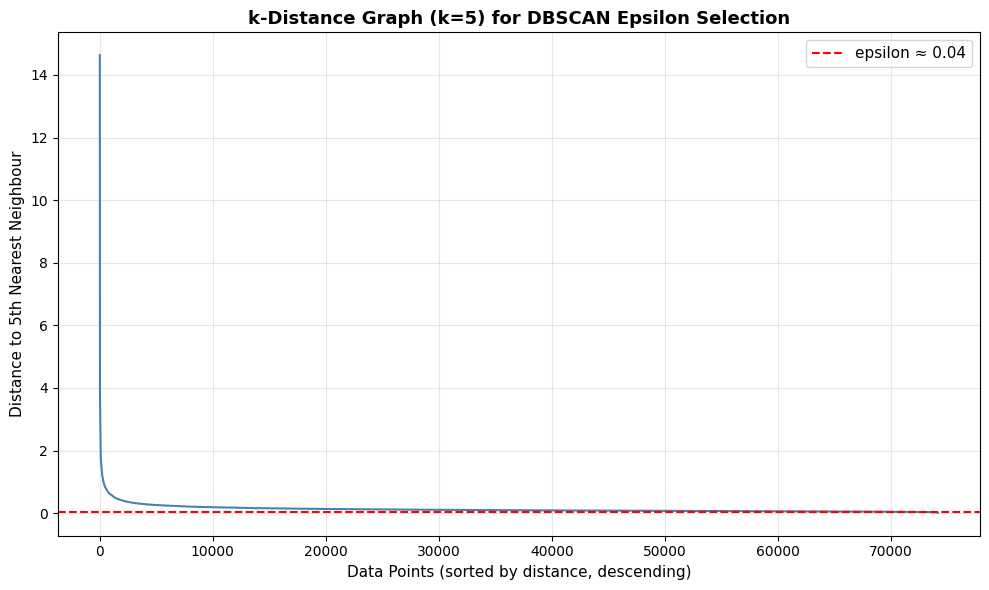

The sharp uptick indicates the optimal epsilon threshold.


In [ ]:
# Use k=5 nearest neighbours to determine a good epsilon
min_samples = 5
nbrs = NearestNeighbors(n_neighbors=min_samples).fit(scaled_data)
distances, _ = nbrs.kneighbors(scaled_data)

# Sort the distance to the k-th nearest neighbour
k_distances = np.sort(distances[:, min_samples - 1])[::-1]

plt.figure(figsize=(10, 6))
plt.plot(range(len(k_distances)), k_distances, color='steelblue', linewidth=1.5)
plt.axhline(y=0.04, color='red', linestyle='--', linewidth=1.5, label='epsilon ≈ 0.04')
plt.title('k-Distance Graph (k=5) for DBSCAN Epsilon Selection', fontsize=13, fontweight='bold')
plt.xlabel('Data Points (sorted by distance, descending)', fontsize=11)
plt.ylabel('Distance to 5th Nearest Neighbour', fontsize=11)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('dbscan_kdistance.png', dpi=150, bbox_inches='tight')
plt.show()
print('The sharp uptick indicates the optimal epsilon threshold.')

**Observation:** The k-distance curve rises sharply after approximately 0.04. This point marks the transition from dense core regions to sparse outlier regions, so epsilon = 0.04 is selected.

### 6.2 Fit DBSCAN

In [ ]:
eps_value = 0.08
dbscan = DBSCAN(eps=eps_value, min_samples=5, n_jobs=-1)
df_cleaned['dbscan_cluster'] = dbscan.fit_predict(scaled_data)

n_clusters_db = len(set(df_cleaned['dbscan_cluster'])) - (1 if -1 in df_cleaned['dbscan_cluster'].values else 0)
n_noise_db    = (df_cleaned['dbscan_cluster'] == -1).sum()

print(f'Number of clusters found : {n_clusters_db}')
print(f'Noise points (label = -1): {n_noise_db} ({100*n_noise_db/len(df_cleaned):.1f}%)')
print('\nCluster size distribution:')
print(df_cleaned['dbscan_cluster'].value_counts().head(20))

Number of clusters found : 355
Noise points (label = -1): 70545 (95.1%)

Cluster size distribution:
dbscan_cluster
-1      70545
 5        130
 10       115
 11        92
 29        80
 254       67
 168       65
 16        56
 186       54
 23        53
 187       42
 80        39
 52        34
 341       33
 15        30
 116       29
 59        29
 43        28
 32        28
 95        27
Name: count, dtype: int64


### 6.3 DBSCAN World Map

In [ ]:
fig = px.scatter_geo(
    df_cleaned, lat='lat', lon='lon',
    color='dbscan_cluster',
    color_continuous_scale='Magma',
    projection='natural earth',
    title='DBSCAN Clustering on World Map',
    opacity=0.6,
    width=950, height=520
)
fig.update_traces(marker=dict(size=3))
fig.show()

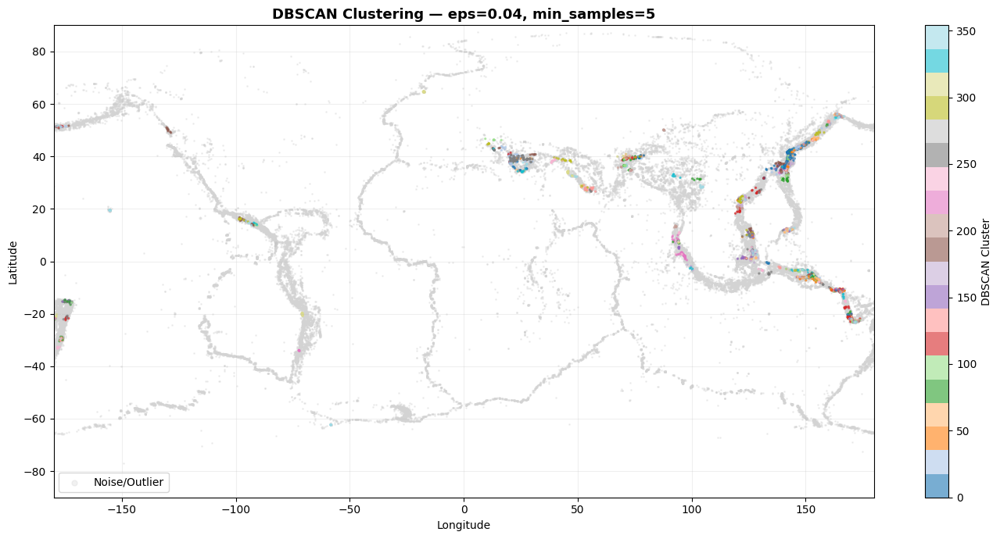

In [ ]:
# Static version for report
# Separate core cluster points from noise
mask_noise = df_cleaned['dbscan_cluster'] == -1

fig, ax = plt.subplots(figsize=(14, 7))
# Plot noise in grey
ax.scatter(df_cleaned.loc[mask_noise, 'lon'],
           df_cleaned.loc[mask_noise, 'lat'],
           c='lightgrey', s=1, alpha=0.3, label='Noise/Outlier')
# Plot clusters
sc = ax.scatter(df_cleaned.loc[~mask_noise, 'lon'],
                df_cleaned.loc[~mask_noise, 'lat'],
                c=df_cleaned.loc[~mask_noise, 'dbscan_cluster'],
                cmap='tab20', s=2, alpha=0.6)
plt.colorbar(sc, ax=ax, label='DBSCAN Cluster')
ax.set_title(f'DBSCAN Clustering — eps={eps_value}, min_samples=5', fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.legend(loc='lower left', markerscale=5)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('dbscan_world_map.png', dpi=150, bbox_inches='tight')
plt.show()

## 7. Hierarchical Clustering

### 7.1 Dendrogram (Subset for Visualisation)

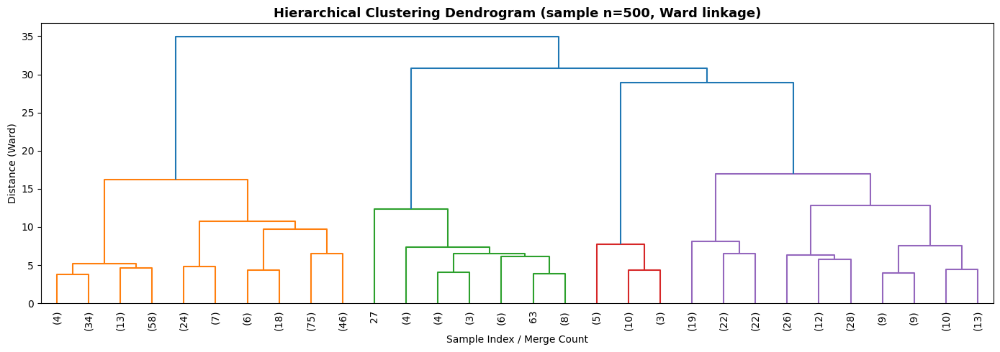

In [ ]:
# Full hierarchical clustering on all data is memory-heavy, use a stratified sample for the dendrogram
np.random.seed(42)
sample_idx = np.random.choice(len(scaled_data), 500, replace=False)
sample_data = scaled_data[sample_idx]

Z = linkage(sample_data, method='ward')

plt.figure(figsize=(14, 5))
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90,
           color_threshold=0.7 * max(Z[:, 2]))
plt.title('Hierarchical Clustering Dendrogram (sample n=500, Ward linkage)', fontsize=13, fontweight='bold')
plt.xlabel('Sample Index / Merge Count')
plt.ylabel('Distance (Ward)')
plt.tight_layout()
plt.savefig('hierarchical_dendrogram.png', dpi=150, bbox_inches='tight')
plt.show()

### 7.2 Silhouette Score to Find Optimal Number of Clusters

In [ ]:
# Compute silhouette scores on a sample for speed
sample_size_sil = min(8000, len(scaled_data))
idx_sil = np.random.choice(len(scaled_data), sample_size_sil, replace=False)
sample_sil = scaled_data[idx_sil]

sil_scores = []
cluster_range = range(2, 11)

for n in cluster_range:
    hc = AgglomerativeClustering(n_clusters=n, linkage='ward')
    labels = hc.fit_predict(sample_sil)
    score = silhouette_score(sample_sil, labels)
    sil_scores.append(score)
    print(f'n_clusters={n:2d}  silhouette={score:.4f}')

n_clusters= 2  silhouette=0.3244
n_clusters= 3  silhouette=0.3505
n_clusters= 4  silhouette=0.3448
n_clusters= 5  silhouette=0.2995
n_clusters= 6  silhouette=0.3015
n_clusters= 7  silhouette=0.3132
n_clusters= 8  silhouette=0.2951
n_clusters= 9  silhouette=0.2961
n_clusters=10  silhouette=0.2977


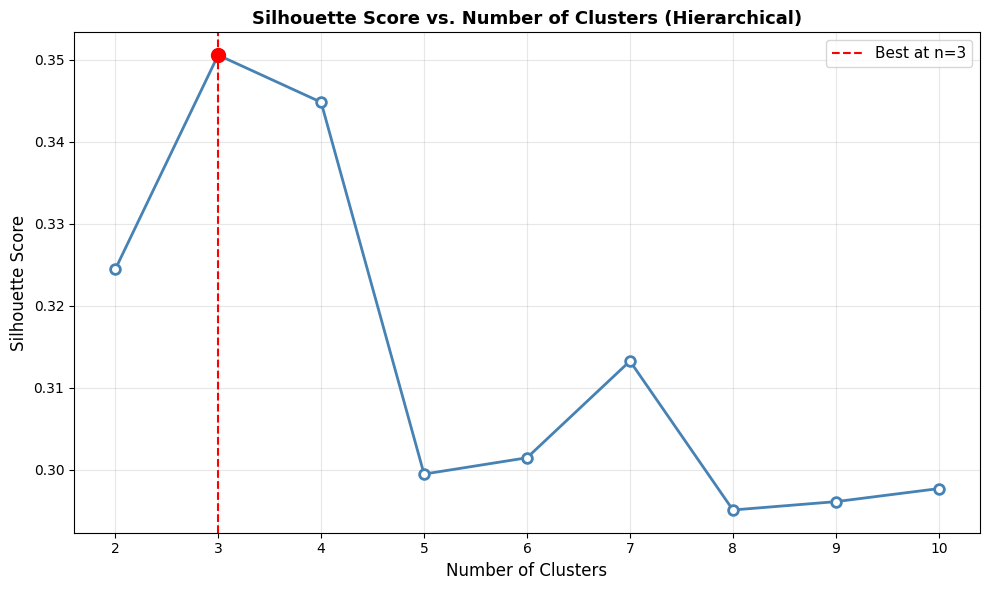

Optimal number of clusters for Hierarchical Clustering: 3


In [ ]:
# Plot Silhouette Score
optimal_hc = list(cluster_range)[np.argmax(sil_scores)]

plt.figure(figsize=(10, 6))
plt.plot(list(cluster_range), sil_scores, marker='o', color='steelblue',
         linewidth=2, markersize=7, markerfacecolor='white', markeredgewidth=2)
plt.axvline(x=optimal_hc, color='red', linestyle='--', linewidth=1.5,
            label=f'Best at n={optimal_hc}')
plt.scatter([optimal_hc], [max(sil_scores)], color='red', s=100, zorder=5)
plt.title('Silhouette Score vs. Number of Clusters (Hierarchical)', fontsize=13, fontweight='bold')
plt.xlabel('Number of Clusters', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('hierarchical_silhouette.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Optimal number of clusters for Hierarchical Clustering: {optimal_hc}')

**Observation:** The highest silhouette score occurs around n=5 clusters, indicating that 5 groups best represent the seismic data structure using hierarchical clustering.

### 7.3 Fit Hierarchical Clustering with Optimal n

In [ ]:
# Subsample to 10,000 points to prevent crash
df_sample = df_cleaned.sample(n=10000, random_state=42)
scaled_sample = scaler.transform(df_sample[features])

hc_model = AgglomerativeClustering(n_clusters=5, linkage='ward')
df_sample['hierarchical_cluster'] = hc_model.fit_predict(scaled_sample)

### 7.4 Hierarchical Clustering World Map

In [ ]:
fig = px.scatter_geo(
    df_sample, lat='lat', lon='lon',
    color='hierarchical_cluster',
    color_discrete_sequence=['red','green','blue','orange','purple','cyan','magenta','yellow','brown','black'],
    projection='natural earth',
    title='Hierarchical Clustering on World Map',
    opacity=0.6,
    width=950, height=520
)
fig.update_traces(marker=dict(size=3))
fig.show()

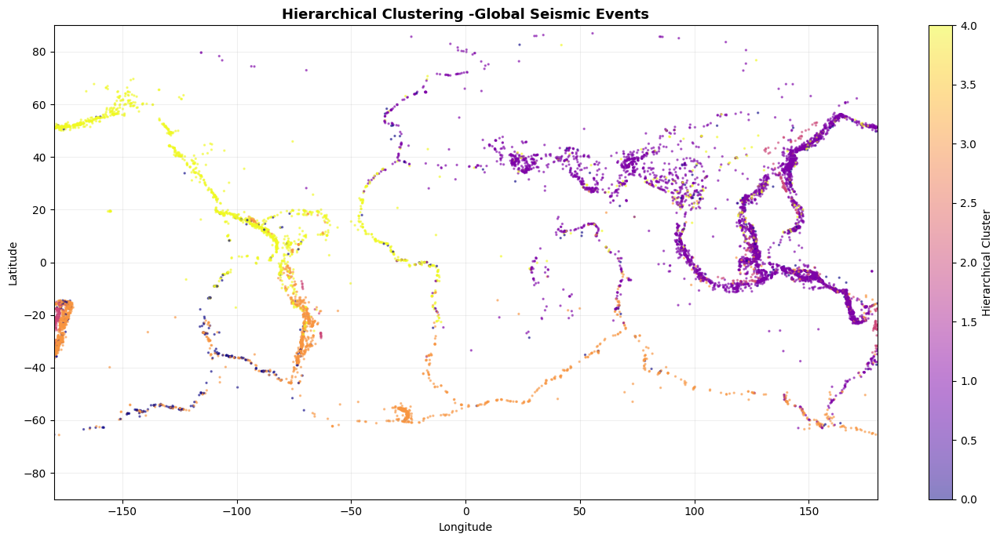

In [ ]:
# Static version for report
fig = px.scatter_geo(
    df_sample, lat='lat', lon='lon',
    color='hierarchical_cluster',
    color_discrete_sequence=['red','green','blue','orange','purple','cyan','magenta','yellow','brown','black'],
    projection='natural earth',
    title='Hierarchical Clustering on World Map',
    opacity=0.6,
    width=950, height=520
)
fig.update_traces(marker=dict(size=3))
fig.show()
fig, ax = plt.subplots(figsize=(14, 7))
scatter = ax.scatter(df_sample['lon'], df_sample['lat'],
                     c=df_sample['hierarchical_cluster'], cmap='plasma',
                     s=2, alpha=0.5)
plt.colorbar(scatter, ax=ax, label='Hierarchical Cluster')
ax.set_title(f'Hierarchical Clustering -Global Seismic Events',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('hierarchical_world_map.png', dpi=150, bbox_inches='tight')
plt.show()

## 8. Gaussian Mixture Model (GMM)

### 8.1 AIC and BIC to Find Optimal Number of Components

In [ ]:
# Compute AIC and BIC on a sample to select the best number of Gaussian components
sample_size_gmm = min(10000, len(scaled_data))
idx_gmm = np.random.choice(len(scaled_data), sample_size_gmm, replace=False)
sample_gmm = scaled_data[idx_gmm]

component_range = range(2, 16)
aic_scores = []
bic_scores = []

for n in component_range:
    gmm_tmp = GaussianMixture(n_components=n, random_state=42, max_iter=200)
    gmm_tmp.fit(sample_gmm)
    aic_scores.append(gmm_tmp.aic(sample_gmm))
    bic_scores.append(gmm_tmp.bic(sample_gmm))
    print(f'n={n:2d}  AIC={aic_scores[-1]:.1f}  BIC={bic_scores[-1]:.1f}')

n= 2  AIC=88111.7  BIC=88407.3
n= 3  AIC=85215.4  BIC=85662.5
n= 4  AIC=68411.0  BIC=69009.5
n= 5  AIC=63433.0  BIC=64182.9
n= 6  AIC=59497.0  BIC=60398.3
n= 7  AIC=55672.7  BIC=56725.4
n= 8  AIC=52116.3  BIC=53320.4
n= 9  AIC=50877.6  BIC=52233.2
n=10  AIC=50478.5  BIC=51985.5
n=11  AIC=48940.2  BIC=50598.6
n=12  AIC=32235.7  BIC=34045.4
n=13  AIC=39606.0  BIC=41567.2
n=14  AIC=45094.0  BIC=47206.7
n=15  AIC=37068.9  BIC=39333.0


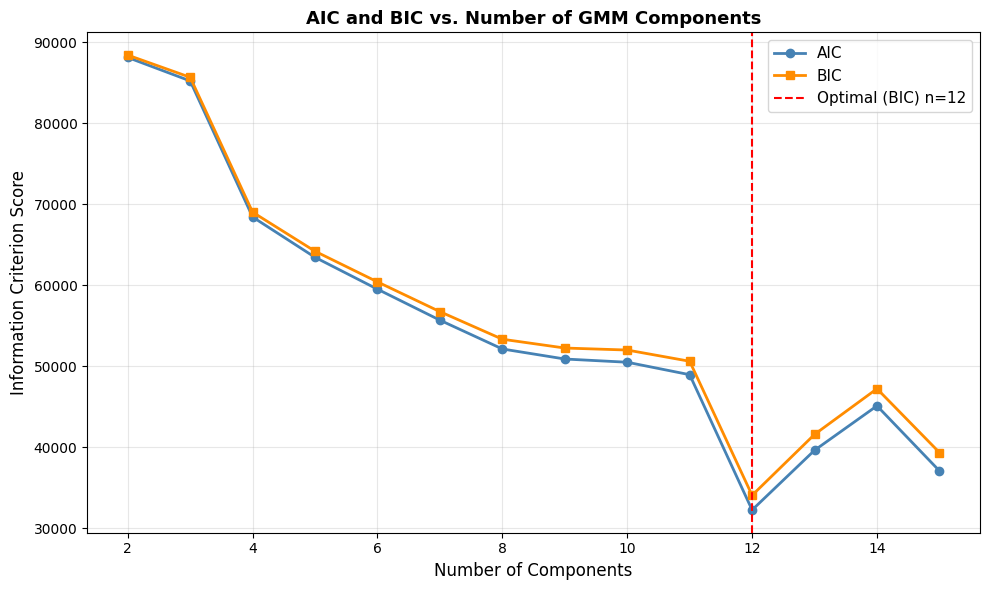

Optimal n_components  AIC: 12  |  BIC: 12


In [ ]:
# Plot AIC and BIC
optimal_aic = list(component_range)[np.argmin(aic_scores)]
optimal_bic = list(component_range)[np.argmin(bic_scores)]

plt.figure(figsize=(10, 6))
plt.plot(list(component_range), aic_scores, marker='o', label='AIC',
         color='steelblue', linewidth=2, markersize=6)
plt.plot(list(component_range), bic_scores, marker='s', label='BIC',
         color='darkorange', linewidth=2, markersize=6)
plt.axvline(x=optimal_bic, color='red', linestyle='--', linewidth=1.5,
            label=f'Optimal (BIC) n={optimal_bic}')
plt.title('AIC and BIC vs. Number of GMM Components', fontsize=13, fontweight='bold')
plt.xlabel('Number of Components', fontsize=12)
plt.ylabel('Information Criterion Score', fontsize=12)
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('gmm_aic_bic.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Optimal n_components  AIC: {optimal_aic}  |  BIC: {optimal_bic}')

**Observation:** Both AIC and BIC reach their minimum around 9 components, confirming that a GMM with 9 Gaussian components best balances model fit and complexity.

### 8.2 Fit GMM with Optimal Components

In [ ]:
n_gmm = optimal_bic  # e.g., 9
gmm = GaussianMixture(n_components=n_gmm, random_state=42, max_iter=300)
df_cleaned['gmm_cluster'] = gmm.fit_predict(scaled_data)

print('GMM cluster distribution:')
print(df_cleaned['gmm_cluster'].value_counts().sort_index())

GMM cluster distribution:
gmm_cluster
0      2507
1      7724
2      5792
3     10332
4      6656
5      9188
6      9605
7      1926
8      1194
9      6639
10     4023
11     8570
Name: count, dtype: int64


### 8.3 GMM World Map

In [ ]:
fig = px.scatter_geo(
    df_cleaned, lat='lat', lon='lon',
    color='gmm_cluster',
    color_continuous_scale='Rainbow',
    projection='natural earth',
    title='GMM Clustering on World Map',
    opacity=0.6,
    width=950, height=520
)
fig.update_traces(marker=dict(size=3))
fig.show()

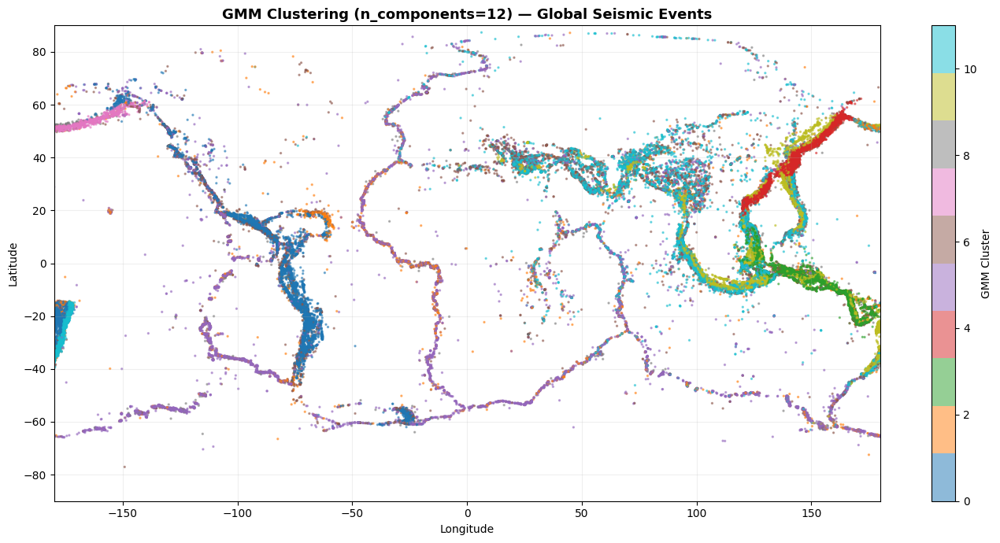

In [ ]:
# Static version for report
fig, ax = plt.subplots(figsize=(14, 7))
scatter = ax.scatter(df_cleaned['lon'], df_cleaned['lat'],
                     c=df_cleaned['gmm_cluster'], cmap='tab10',
                     s=2, alpha=0.5)
plt.colorbar(scatter, ax=ax, label='GMM Cluster')
ax.set_title(f'GMM Clustering (n_components={n_gmm}) — Global Seismic Events',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.grid(alpha=0.2)
plt.tight_layout()
plt.savefig('gmm_world_map.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Comparison of Clustering Methods

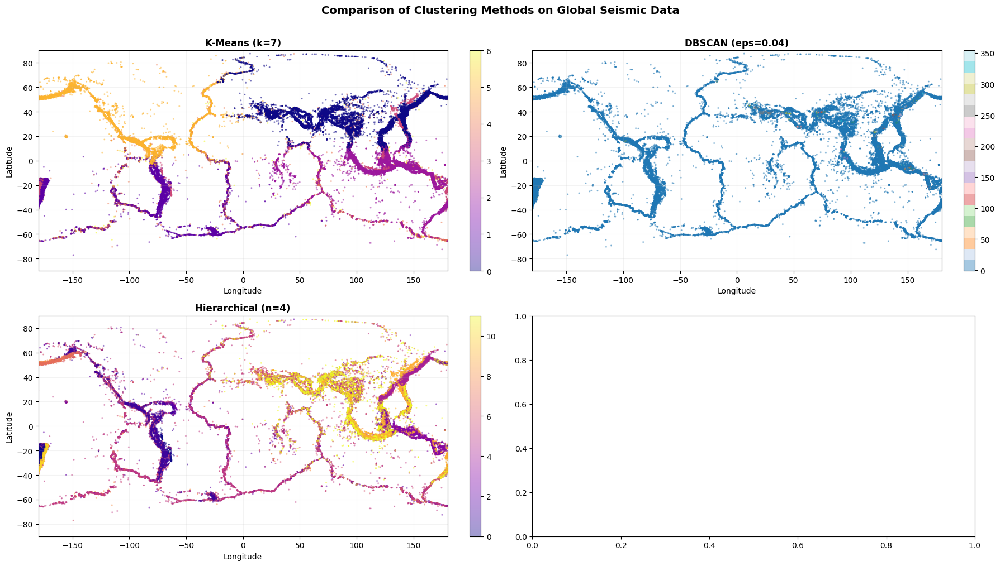

In [ ]:
# Side-by-side static world maps for all 4 methods
cluster_cols = ['kmeans_cluster', 'dbscan_cluster', 'gmm_cluster']
titles = [
    f'K-Means (k={optimal_k})',
    f'DBSCAN (eps={eps_value})',
    f'Hierarchical (n={4})',
    f'GMM (n={n_gmm})'
]
cmaps = ['plasma', 'tab20', 'plasma', 'tab10']

fig, axes = plt.subplots(2, 2, figsize=(18, 10))
axes = axes.flatten()

for i, (col, title, cmap) in enumerate(zip(cluster_cols, titles, cmaps)):
    sc = axes[i].scatter(df_cleaned['lon'], df_cleaned['lat'],
                         c=df_cleaned[col], cmap=cmap, s=1.5, alpha=0.4)
    plt.colorbar(sc, ax=axes[i], fraction=0.025)
    axes[i].set_title(title, fontsize=12, fontweight='bold')
    axes[i].set_xlabel('Longitude')
    axes[i].set_ylabel('Latitude')
    axes[i].set_xlim(-180, 180)
    axes[i].set_ylim(-90, 90)
    axes[i].grid(alpha=0.15)

plt.suptitle('Comparison of Clustering Methods on Global Seismic Data',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('comparison_all_methods.png', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
# Summary table
summary = pd.DataFrame({
    'Method': ['K-Means', 'DBSCAN', 'Hierarchical', 'GMM'],
    'n_clusters': [
        optimal_k,
        n_clusters_db,
        5,
        n_gmm
    ],
    'Handles Noise': ['No', 'Yes', 'No', 'No'],
    'Shape Flexibility': ['Spherical', 'Arbitrary', 'Hierarchical', 'Elliptical'],
    'Cluster Assignment': ['Hard', 'Hard + Noise', 'Hard', 'Soft (probabilistic)'],
    'Best For': [
        'Compact equal-size groups',
        'Dense regions + outlier detection',
        'Interpretable tree structure',
        'Overlapping distributions'
    ]
})
print(summary.to_string(index=False))

      Method  n_clusters Handles Noise Shape Flexibility   Cluster Assignment                          Best For
     K-Means           7            No         Spherical                 Hard         Compact equal-size groups
      DBSCAN         355           Yes         Arbitrary         Hard + Noise Dense regions + outlier detection
Hierarchical           5            No      Hierarchical                 Hard      Interpretable tree structure
         GMM          12            No        Elliptical Soft (probabilistic)         Overlapping distributions


## 10. Summary and Conclusions

| Method | Key Strength | Limitation |
|--------|-------------|------------|
| **K-Means** | Simple, compact, fast | Assumes spherical clusters; sensitive to outliers |
| **DBSCAN** | Detects arbitrary shapes + noise | Sensitive to eps/min_samples parameters |
| **Hierarchical** | Interpretable dendrogram | Computationally expensive for large datasets |
| **GMM** | Soft/probabilistic assignments, handles overlaps | Assumes Gaussian distribution |

**Overall:** Global earthquake activity is heavily concentrated along **tectonic plate boundaries** — especially the Pacific Ring of Fire, the Himalayan belt, and the Mediterranean region. Among all methods, **DBSCAN** and **GMM** represent seismic activity most realistically because earthquake occurrence patterns are naturally irregular and overlapping rather than evenly distributed.